<a href="https://colab.research.google.com/github/jcalz23/logo_detection_w281/blob/main/Yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14302, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 14302 (delta 26), reused 25 (delta 8), pack-reused 14242
Receiving objects: 100% (14302/14302), 13.65 MiB | 33.51 MiB/s, done.
Resolving deltas: 100% (9833/9833), done.
/content/yolov5
     |████████████████████████████████| 182 kB 4.5 MB/s 
     |████████████████████████████████| 62 kB 804 kB/s 
     |████████████████████████████████| 1.6 MB 64.3 MB/s 
     |████████████████████████████████| 42 kB 338 kB/s 
     |████████████████████████████████| 178 kB 8.4 MB/s 
     |████████████████████████████████| 138 kB 70.5 MB/s 
     |████████████████████████████████| 145 kB 67.5 MB/s 
     |████████████████████████████████| 67 kB 4.4 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 62 kB 834 kB/s 
Setup complete. Using torch 1.12.1+cu113 (A100-SXM4-40GB)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [2]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="yolov5_logo_detection")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=yolov5_logo_detection


In [5]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

name_run='yolov5_50thres_300ep'
api_key='eLXFN41nnSBFe1Xx7JPW'
#api_key='put_api_key_here'

In [4]:
rf = Roboflow(api_key=api_key)
project = rf.workspace().project("ucbmidsw281f22/w281logodetection")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/w281LogoDetection-1 in yolov5pytorch:: 100%|██████████| 6136/6136 [00:00<00:00, 6981.56it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [6]:
!python train.py --img 640 --batch 16 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5s.pt --name {name_run} --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/w281LogoDetection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=name_run, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1049), started 0:01:33 ago. (Use '!kill 1049' to kill it.)

<IPython.core.display.Javascript object>

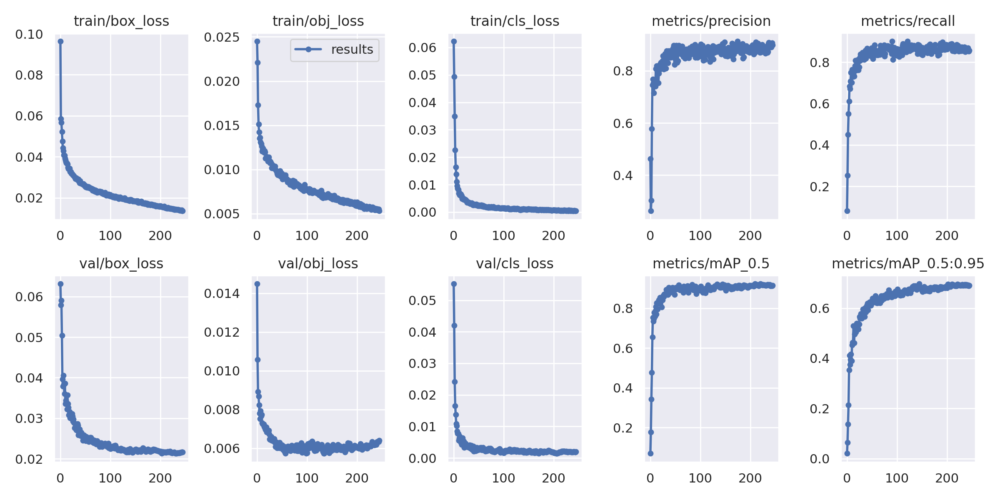

In [10]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/'+name_run+'/results.png', width=1000)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [12]:
!python detect.py --weights runs/train/{name_run}/weights/best.pt --img 640 --conf-thres 0.5 --iou-thres 0.5 --source {dataset.location}/test/images --name {name_run}

detect: weights=['runs/train/yolov5_50thres_300ep/weights/best.pt'], source=/content/datasets/w281LogoDetection-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov5_50thres_300ep, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
image 1/460 /content/datasets/w281LogoDetection-1/test/images/000002_jpg.rf.97ba94fce7114bad18f51c84dfd23ee6.jpg: 640x640 1 adidas, 9.9ms
image 2/460 /content/datasets/w281LogoDetection-1/test/images/000021_jpg.rf.7633fe496fbc3df3db94cca84c38ed0f.jpg: 640x640 2 adidass, 9.9ms
im

In [13]:
!python val.py --data {dataset.location}/data.yaml --weights runs/train/{name_run}/weights/best.pt --task 'val' --project 'runs/val' --name {name_run} --conf-thres 0.5 --iou-thres 0.5 

val: data=/content/datasets/w281LogoDetection-1/data.yaml, weights=['runs/train/yolov5_50thres_300ep/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.5, iou_thres=0.5, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=yolov5_50thres_300ep, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/datasets/w281LogoDetection-1/valid/labels.cache... 460 images, 0 backgrounds, 0 corrupt: 100% 460/460 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 15/15 [00:04<00:00,  3.03it/s]
                   all        460        672      0.904    

In [17]:
!python val.py --data {dataset.location}/data.yaml --weights runs/train/{name_run}/weights/best.pt --task 'test' --project 'runs/test' --name {name_run} --conf-thres 0.5 --iou-thres 0.5 

val: data=/content/datasets/w281LogoDetection-1/data.yaml, weights=['runs/train/yolov5_50thres_300ep/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.5, iou_thres=0.5, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/test, name=yolov5_50thres_300ep, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/datasets/w281LogoDetection-1/test/labels... 460 images, 0 backgrounds, 0 corrupt: 100% 460/460 [00:00<00:00, 8193.04it/s]
test: New cache created: /content/datasets/w281LogoDetection-1/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 15/

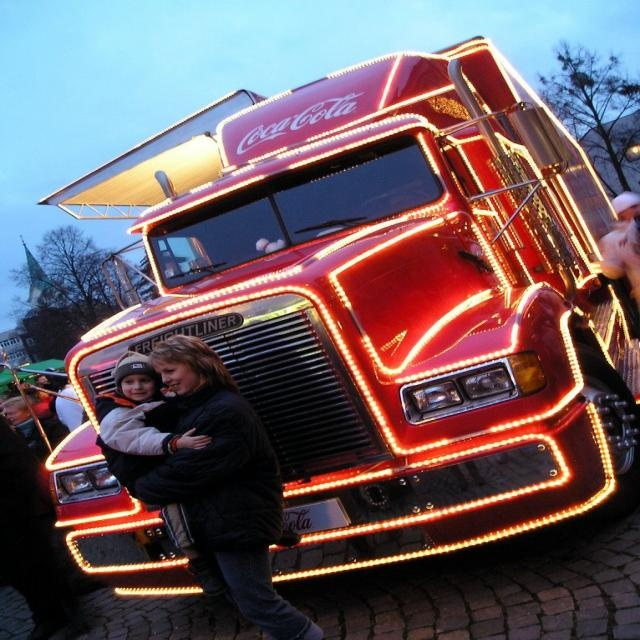

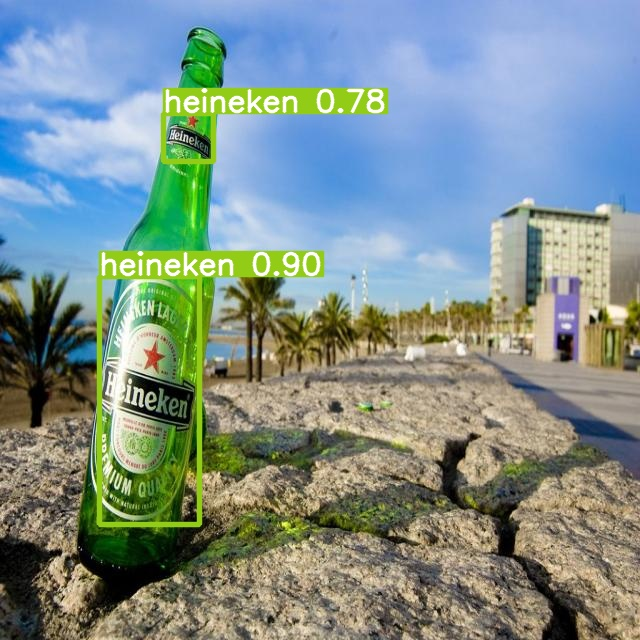

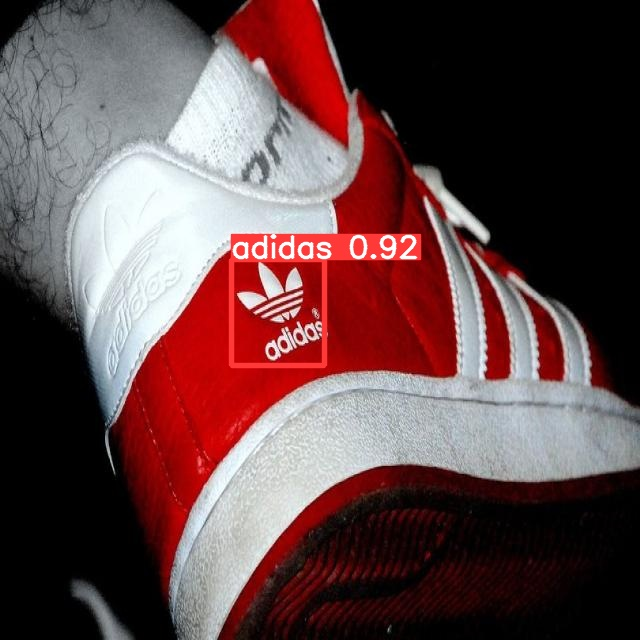

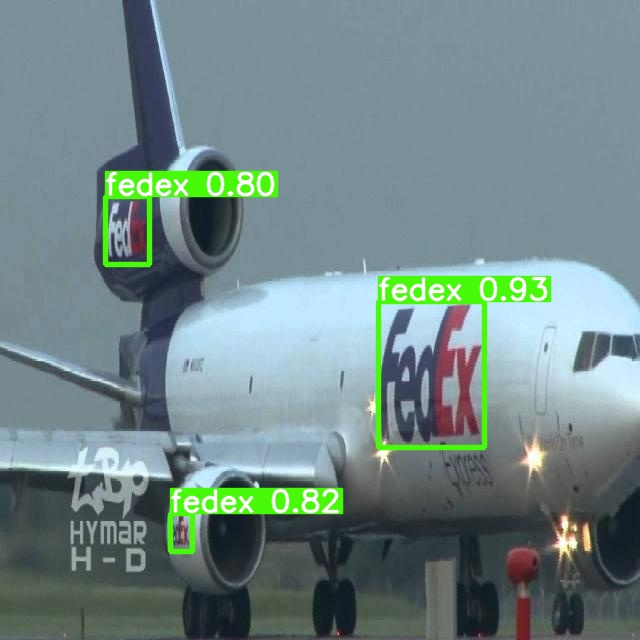

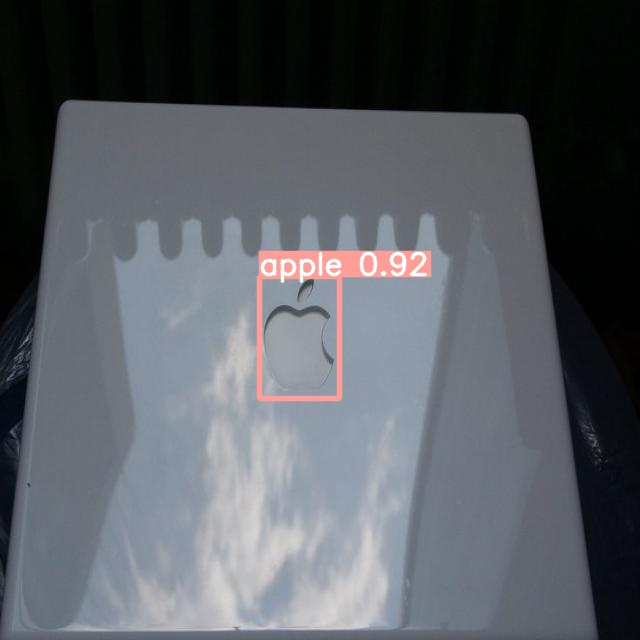

...

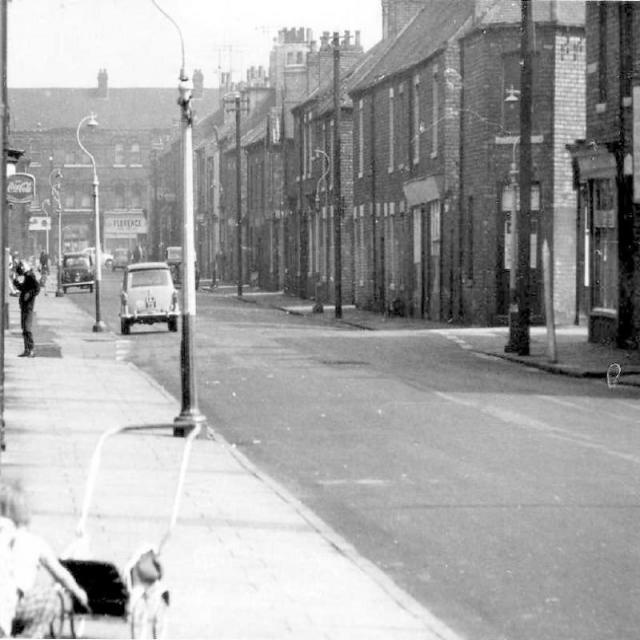

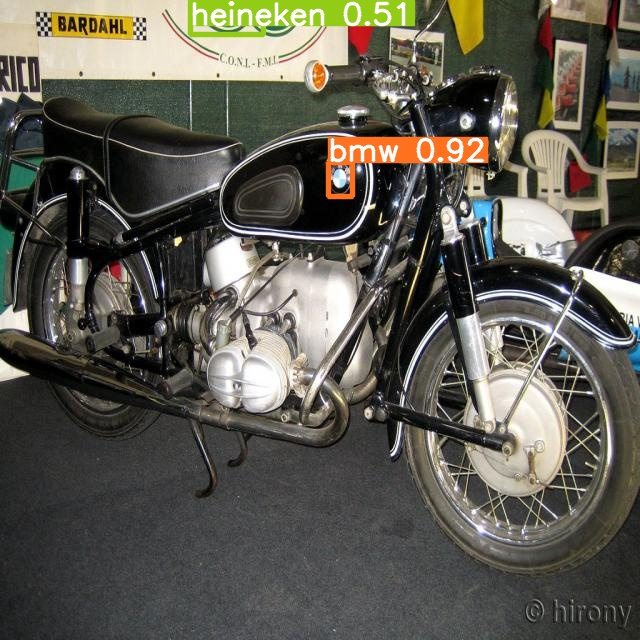

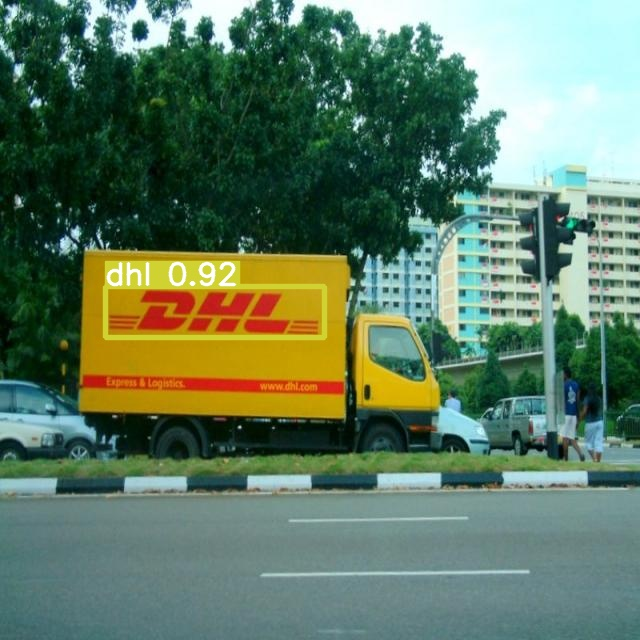

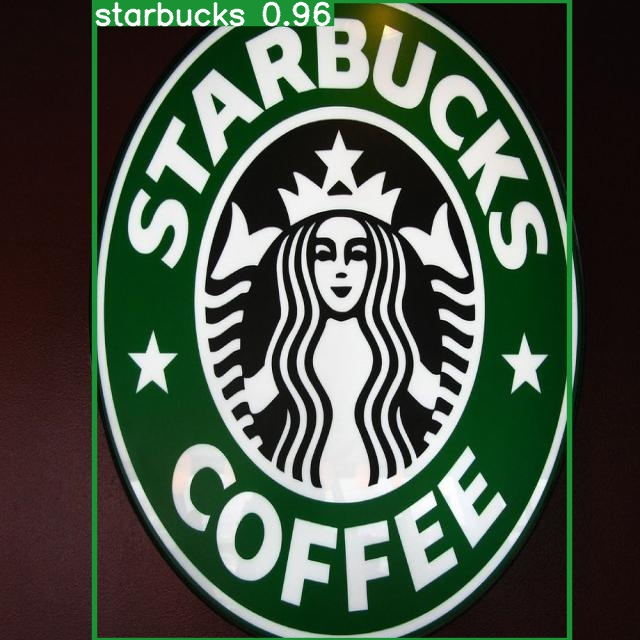

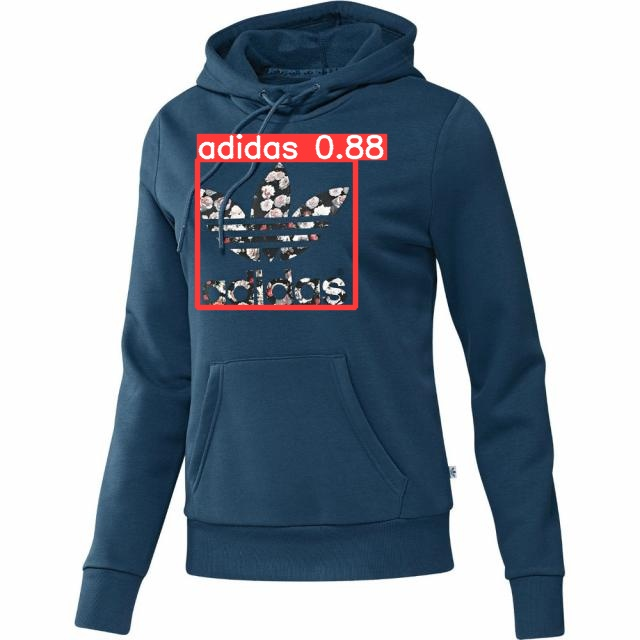

In [20]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

limit = 20
i=0
for imageName in glob.glob('/content/yolov5/runs/detect/'+name_run+'/*.jpg'): #assuming JPG
   if i < limit:
      display(Image(filename=imageName))
      print("\n")
   i = i + 1

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!rm -rf /content/yolov5/runs/val/yolov5s_results
!rm -rf /content/yolov5/runs/test/yolov5s_results

In [21]:
from google.colab import auth
auth.authenticate_user()

In [22]:
!gsutil -mq cp -r -n /content/yolov5/runs gs://w281finalprojectlogo/yolov5